In [1]:
# Import necessary libraries
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA

In [2]:
# Set environment variables for reproducibility
os.environ["OPENBLAS_NUM_THREADS"] = "1"
os.environ["MKL_NUM_THREADS"] = "1"
os.environ["OMP_NUM_THREADS"] = "1"

In [3]:
# Load the dataset
data = pd.read_csv('data.csv').reset_index(drop=True)
data.head()

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
0,0.0594,1921,0.982,"['Sergei Rachmaninoff', 'James Levine', 'Berli...",0.279,831667,0.211,0,4BJqT0PrAfrxzMOxytFOIz,0.878000,10,0.665,-20.096,1,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",4,1921,0.0366,80.954
1,0.9630,1921,0.732,['Dennis Day'],0.819,180533,0.341,0,7xPhfUan2yNtyFG0cUWkt8,0.000000,7,0.160,-12.441,1,Clancy Lowered the Boom,5,1921,0.4150,60.936
2,0.0394,1921,0.961,['KHP Kridhamardawa Karaton Ngayogyakarta Hadi...,0.328,500062,0.166,0,1o6I8BglA6ylDMrIELygv1,0.913000,3,0.101,-14.850,1,Gati Bali,5,1921,0.0339,110.339
3,0.1650,1921,0.967,['Frank Parker'],0.275,210000,0.309,0,3ftBPsC5vPBKxYSee08FDH,0.000028,5,0.381,-9.316,1,Danny Boy,3,1921,0.0354,100.109
4,0.2530,1921,0.957,['Phil Regan'],0.418,166693,0.193,0,4d6HGyGT8e121BsdKmw9v6,0.000002,3,0.229,-10.096,1,When Irish Eyes Are Smiling,2,1921,0.0380,101.665


In [4]:
data.shape

(170653, 19)

In [5]:
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170653 entries, 0 to 170652
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   valence           170653 non-null  float64
 1   year              170653 non-null  int64  
 2   acousticness      170653 non-null  float64
 3   artists           170653 non-null  object 
 4   danceability      170653 non-null  float64
 5   duration_ms       170653 non-null  int64  
 6   energy            170653 non-null  float64
 7   explicit          170653 non-null  int64  
 8   id                170653 non-null  object 
 9   instrumentalness  170653 non-null  float64
 10  key               170653 non-null  int64  
 11  liveness          170653 non-null  float64
 12  loudness          170653 non-null  float64
 13  mode              170653 non-null  int64  
 14  name              170653 non-null  object 
 15  popularity        170653 non-null  int64  
 16  release_date      17

In [6]:
data.isna().sum()

valence             0
year                0
acousticness        0
artists             0
danceability        0
duration_ms         0
energy              0
explicit            0
id                  0
instrumentalness    0
key                 0
liveness            0
loudness            0
mode                0
name                0
popularity          0
release_date        0
speechiness         0
tempo               0
dtype: int64

In [7]:
# Check for any duplicate rows
duplicates = data[data.duplicated()]

# Display duplicate rows, if any
print(f"Number of duplicate rows: {len(duplicates)}")

Number of duplicate rows: 0


In [8]:
data.describe(include='all')

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
count,170653.000000,170653.000000,170653.000000,170653,170653.000000,1.706530e+05,170653.000000,170653.000000,170653,170653.000000,170653.000000,170653.000000,170653.000000,170653.000000,170653,170653.000000,170653,170653.000000,170653.000000
unique,NaN,NaN,NaN,34088,NaN,NaN,NaN,NaN,170653,NaN,NaN,NaN,NaN,NaN,133638,NaN,11244,NaN,NaN
top,NaN,NaN,NaN,['Эрнест Хемингуэй'],NaN,NaN,NaN,NaN,4BJqT0PrAfrxzMOxytFOIz,NaN,NaN,NaN,NaN,NaN,White Christmas,NaN,1945,NaN,NaN
freq,NaN,NaN,NaN,1211,NaN,NaN,NaN,NaN,1,NaN,NaN,NaN,NaN,NaN,73,NaN,1446,NaN,NaN
mean,0.528587,1976.787241,0.502115,NaN,0.537396,2.309483e+05,0.482389,0.084575,NaN,0.167010,5.199844,0.205839,-11.467990,0.706902,NaN,31.431794,NaN,0.098393,116.861590
std,0.263171,25.917853,0.376032,NaN,0.176138,1.261184e+05,0.267646,0.278249,NaN,0.313475,3.515094,0.174805,5.697943,0.455184,NaN,21.826615,NaN,0.162740,30.708533
min,0.000000,1921.000000,0.000000,NaN,0.000000,5.108000e+03,0.000000,0.000000,NaN,0.000000,0.000000,0.000000,-60.000000,0.000000,NaN,0.000000,NaN,0.000000,0.000000
25%,0.317000,1956.000000,0.102000,NaN,0.415000,1.698270e+05,0.255000,0.000000,NaN,0.000000,2.000000,0.098800,-14.615000,0.000000,NaN,11.000000,NaN,0.034900,93.421000
50%,0.540000,1977.000000,0.516000,NaN,0.548000,2.074670e+05,0.471000,0.000000,NaN,0.000216,5.000000,0.136000,-10.580000,1.000000,NaN,33.000000,NaN,0.045000,114.729000
75%,0.747000,1999.000000,0.893000,NaN,0.668000,2.624000e+05,0.703000,0.000000,NaN,0.102000,8.000000,0.261000,-7.183000,1.000000,NaN,48.000000,NaN,0.075600,135.537000


In [9]:
data = data.drop(['id'], axis = 1)

# **Data Understanding by Visualization and EDA**

In [10]:
# Feature Engineering: Add decade column for better insights
def get_decade(year):
    return f"{int(year // 10) * 10}s"

data['decade'] = data['year'].apply(get_decade)

C:\Users\pavan\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<Axes: xlabel='decade', ylabel='count'>

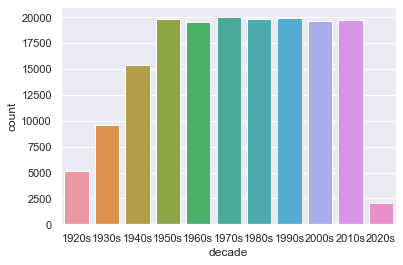

In [11]:
sns.set(rc={'figure.figsize':(11 ,6)})
sns.countplot(data['decade'])

In [12]:
# Select relevant numerical features for clustering and recommendations
numeric_features = [
    'popularity', 'duration_ms', 'danceability', 'energy', 'key',
    'loudness', 'speechiness', 'acousticness', 'instrumentalness',
    'liveness', 'valence', 'tempo', 'year'
]

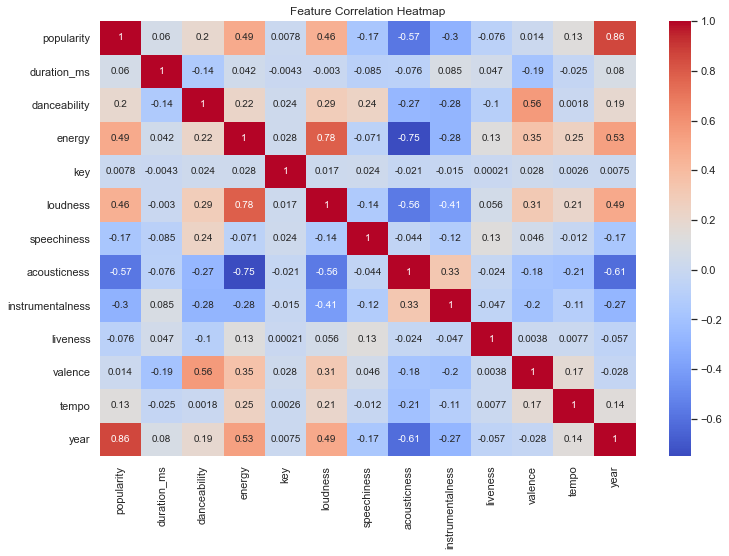

In [13]:
# Plot heatmap for the correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(data[numeric_features].corr(), annot=True, cmap='coolwarm')
plt.title('Feature Correlation Heatmap')
plt.show()

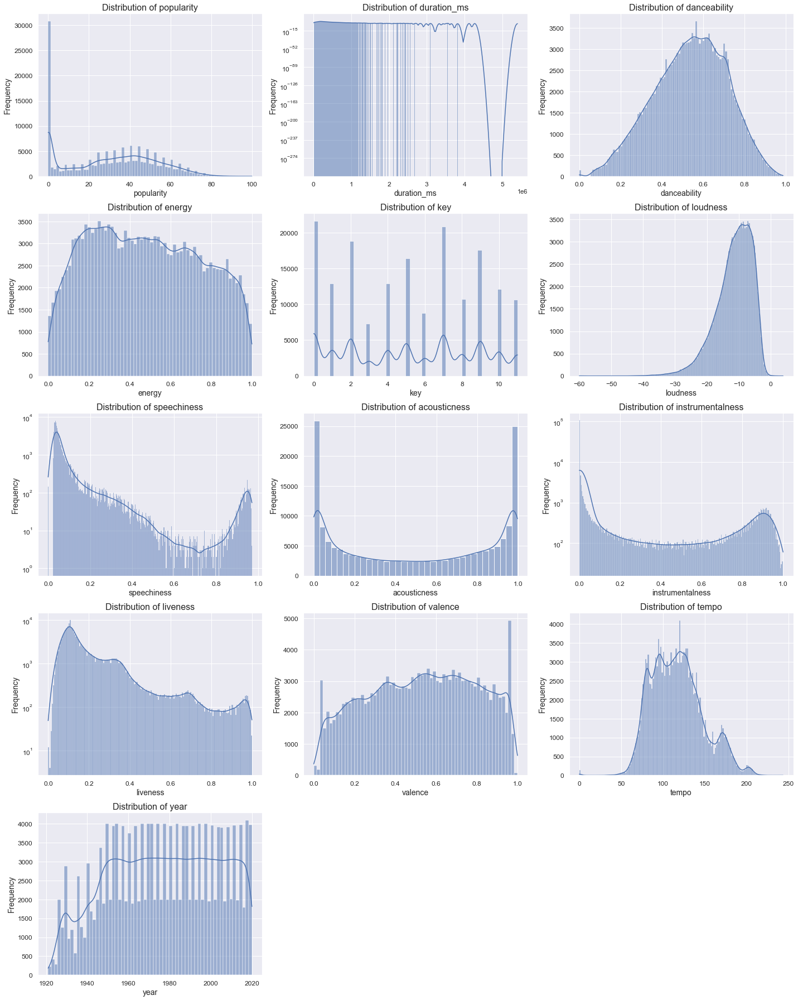

In [14]:
# Plot distributions for each numerical column
plt.figure(figsize=(20, 25))  # Adjust figure size for better visibility
for i, col in enumerate(numeric_features, 1):
    plt.subplot((len(numeric_features) + 2) // 3, 3, i)  # Dynamically create a grid layout
    sns.histplot(data[col], kde=True, log_scale=(False, True) if data[col].skew() > 1 else False)  # Log scale if highly skewed
    plt.title(f'Distribution of {col}', fontsize=16)
    plt.xlabel(col, fontsize=14)
    plt.ylabel('Frequency', fontsize=14)
    plt.xticks(fontsize=12)  # Adjust x-axis tick label size
    plt.yticks(fontsize=12)  # Adjust y-axis tick label size
    
plt.tight_layout()  # Ensure subplots do not overlap
plt.show()


In [15]:
# Normalize the numeric features
scaler = StandardScaler()
data[numeric_features] = scaler.fit_transform(data[numeric_features])

In [16]:
# Optional: Dimensionality reduction with PCA to avoid noise
pca = PCA(n_components=0.95)  # Retain 95% variance
X_reduced = pca.fit_transform(data[numeric_features])

In [22]:
# Reduce dimensionality to 2 components for visualization
pca_2d = PCA(n_components=2)
pca_result_2d = pca_2d.fit_transform(X_reduced)

In [23]:
# Create a DataFrame for visualization
pca_df = pd.DataFrame(pca_result_2d, columns=['PC1', 'PC2'])
pca_df['cluster'] = data['cluster']

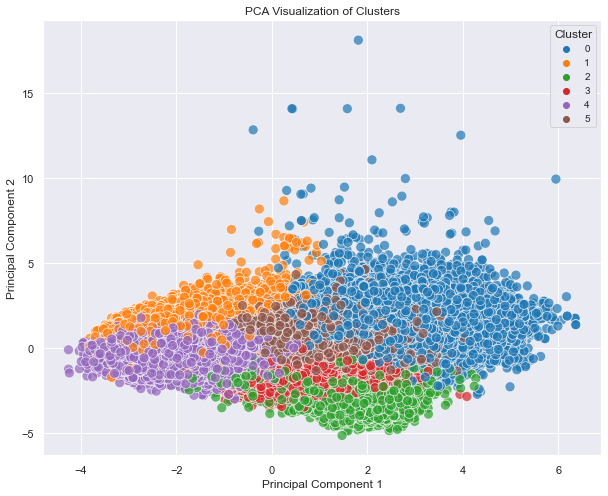

In [24]:
# Plot the PCA groupings
plt.figure(figsize=(10, 8))
sns.scatterplot(
    data=pca_df,
    x='PC1',
    y='PC2',
    hue='cluster',
    palette='tab10',
    s=100,
    alpha=0.7
)
plt.title("PCA Visualization of Clusters")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend(title="Cluster", loc='best', fontsize=10)
plt.grid(True)
plt.show()

In [17]:
# Determine the optimal number of clusters using the Elbow Method
inertia_scores = []
cluster_range = range(1, 15)  # Test up to 15 clusters
for n_clusters in cluster_range:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
    kmeans.fit(X_reduced)
    inertia_scores.append(kmeans.inertia_)

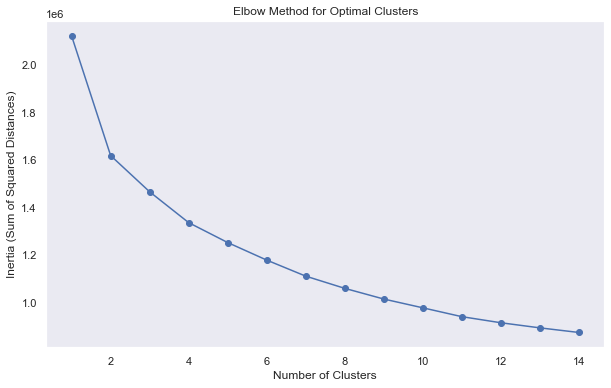

In [18]:
# Plot the Elbow Method
plt.figure(figsize=(10, 6))
plt.plot(cluster_range, inertia_scores, marker='o')
plt.title("Elbow Method for Optimal Clusters")
plt.xlabel("Number of Clusters")
plt.ylabel("Inertia (Sum of Squared Distances)")
plt.grid()
plt.show()

In [19]:
optimal_clusters = 6
kmeans = KMeans(n_clusters=optimal_clusters, random_state=42, n_init=10)
data['cluster'] = kmeans.fit_predict(X_reduced)

In [20]:
# Evaluate clustering performance using Silhouette Score
silhouette_avg = silhouette_score(X_reduced, data['cluster'])
print(f"Silhouette Score: {silhouette_avg}")

Silhouette Score: 0.14434139769743357


In [21]:
# Visualize clusters using t-SNE for interpretability
tsne = TSNE(n_components=2, random_state=42, verbose=1)
tsne_result = tsne.fit_transform(X_reduced)
projection = pd.DataFrame(columns=['x', 'y'], data=tsne_result)
projection['cluster'] = data['cluster']

# Plot t-SNE results
fig = px.scatter(
    projection,
    x='x',
    y='y',
    color=projection['cluster'].astype(str),
    title="t-SNE Visualization of Clusters"
)
fig.show()

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 170653 samples in 0.403s...
[t-SNE] Computed neighbors for 170653 samples in 173.517s...
[t-SNE] Computed conditional probabilities for sample 1000 / 170653
[t-SNE] Computed conditional probabilities for sample 2000 / 170653
[t-SNE] Computed conditional probabilities for sample 3000 / 170653
[t-SNE] Computed conditional probabilities for sample 4000 / 170653
[t-SNE] Computed conditional probabilities for sample 5000 / 170653
[t-SNE] Computed conditional probabilities for sample 6000 / 170653
[t-SNE] Computed conditional probabilities for sample 7000 / 170653
[t-SNE] Computed conditional probabilities for sample 8000 / 170653
[t-SNE] Computed conditional probabilities for sample 9000 / 170653
[t-SNE] Computed conditional probabilities for sample 10000 / 170653
[t-SNE] Computed conditional probabilities for sample 11000 / 170653
[t-SNE] Computed conditional probabilities for sample 12000 / 170653
[t-SNE] Computed conditional proba

[t-SNE] Computed conditional probabilities for sample 120000 / 170653
[t-SNE] Computed conditional probabilities for sample 121000 / 170653
[t-SNE] Computed conditional probabilities for sample 122000 / 170653
[t-SNE] Computed conditional probabilities for sample 123000 / 170653
[t-SNE] Computed conditional probabilities for sample 124000 / 170653
[t-SNE] Computed conditional probabilities for sample 125000 / 170653
[t-SNE] Computed conditional probabilities for sample 126000 / 170653
[t-SNE] Computed conditional probabilities for sample 127000 / 170653
[t-SNE] Computed conditional probabilities for sample 128000 / 170653
[t-SNE] Computed conditional probabilities for sample 129000 / 170653
[t-SNE] Computed conditional probabilities for sample 130000 / 170653
[t-SNE] Computed conditional probabilities for sample 131000 / 170653
[t-SNE] Computed conditional probabilities for sample 132000 / 170653
[t-SNE] Computed conditional probabilities for sample 133000 / 170653
[t-SNE] Computed con

In [31]:
from sklearn.metrics.pairwise import cosine_similarity

def recommend_songs(song_name, data, n_recommendations=5):
    # Ensure the song exists in the dataset
    target = data[data['name'].str.lower() == song_name.lower()]
    if target.empty:
        raise ValueError(f"Track '{song_name}' not found!")
    
    # Numeric features used for similarity calculation
    numeric_features = [
        'popularity', 'duration_ms', 'danceability', 'energy', 'key',
        'loudness', 'speechiness', 'acousticness', 'instrumentalness',
        'liveness', 'valence', 'tempo', 'year'
    ]
    
    # Identify the target song's cluster
    target_cluster = target['cluster'].values[0]
    
    # Filter the data for the same cluster as the target song
    cluster_data = data[data['cluster'] == target_cluster].copy()
    
    # Reset index to ensure alignment
    cluster_data = cluster_data.reset_index(drop=True)
    
    # Compute cosine similarity for the target song within the cluster
    similarities = cosine_similarity(cluster_data[numeric_features], target[numeric_features])
    
    # Flatten the similarities and ensure alignment with cluster_data
    cluster_data['similarity'] = similarities[:, 0]
    
    # Recommend songs sorted by similarity
    recommendations = cluster_data.sort_values(by='similarity', ascending=False).head(n_recommendations + 1)
    
    # Exclude the target song itself from the recommendations
    return recommendations[['name', 'artists', 'similarity']].iloc[1:]

# Example usage
try:
    song_name = "Shape of You"  # Replace with your desired song name
    recommendations = recommend_songs(song_name, data)
    print(recommendations)
except ValueError as e:
    print(e)


                                                name  \
23307                                   Shape of You   
12910                     Tick Tock (feat. 24kGoldn)   
42592                                     On the Low   
28547                                    Lupe Campos   
6632   Sunflower - Spider-Man: Into the Spider-Verse   

                                     artists  similarity  
23307                         ['Ed Sheeran']    0.993673  
12910  ['Clean Bandit', 'Mabel', '24kGoldn']    0.977320  
42592                          ['Burna Boy']    0.976166  
28547    ['El Fantasma', 'Los Dos Carnales']    0.974818  
6632             ['Post Malone', 'Swae Lee']    0.973482  


In [32]:
import pickle

# Save the preprocessed data
data.to_csv("preprocessed_data.csv", index=False)

# Save the trained KMeans model
with open("kmeans_model.pkl", "wb") as f:
    pickle.dump(kmeans, f)

print("Model and data saved successfully!")

Model and data saved successfully!
